# Path of different "Roles" in Punt plays
How do they differ?

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pylab as plt
import os
import glob
from tqdm import tqdm

%matplotlib inline

In [2]:
role_df_all = pd.DataFrame()
role = 'PR'
count = 1
for filepath in tqdm(glob.iglob('../working/playlevel/during_play/*.csv')):
    play = pd.read_csv(filepath, index_col=[0])
    if len(play.loc[(play['role'] == role) & (play['event'].fillna('no event') == 'ball_snap')]) != 0:
        # Only append if this player and a snap exist for the play
        ballsnapx = play.loc[(play['role'] == role) & (play['event'] == 'ball_snap')]['x'].values[0]
        ballsnapy = play.loc[(play['role'] == role) & (play['event'] == 'ball_snap')]['y'].values[0]
        play['x-rel-snap'] = play['x'] - ballsnapx
        play['y-rel-snap'] = play['y'] - ballsnapy
        role_df = play.loc[(play['role'] == role)][['season_year','gamekey','playid','time',
                                          'x-rel-snap','y-rel-snap','mph','injured_player','primary_partner_player']]
        if not play['left_to_right'].values[0]:
            role_df['x-rel-snap'] = role_df['x-rel-snap'] * -1
            play['y-rel-snap'] = play['y-rel-snap'] * -1
        role_df_all = pd.concat([role_df_all, role_df])
    count += 1

1851it [01:11, 25.93it/s]/Users/robmulla/anaconda2/envs/kaggle/lib/python3.6/site-packages/IPython/core/interactiveshell.py:2785: DtypeWarning: Columns (12) have mixed types. Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)
6647it [06:06, 18.12it/s]


In [3]:
role_df_all.to_parquet('../working/playlevel/PR_position_all_plays.parquet')

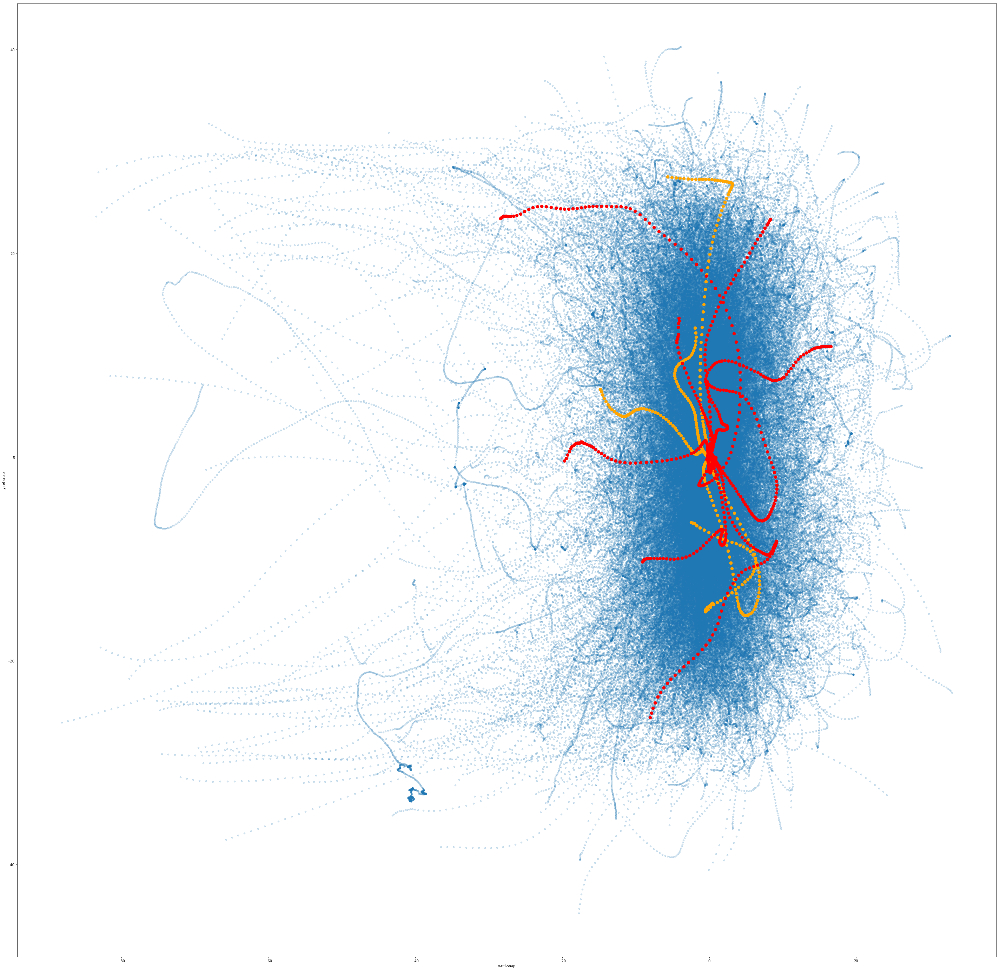

In [14]:
ax = role_df_all.plot(x='x-rel-snap',y='y-rel-snap', kind='scatter', figsize=(50, 50), alpha=0.2)

role_df_all[role_df_all['injured_player']].plot(x='x-rel-snap', y='y-rel-snap',
                                                        kind='scatter', figsize=(50, 50),
                                                       color='orange', lw=5, ax=ax)
role_df_all[role_df_all['primary_partner_player']].plot(x='x-rel-snap', y='y-rel-snap',
                                                        kind='scatter', figsize=(50, 50),
                                                       color='red', lw=5, ax=ax)
plt.show()

In [16]:
pd.read_csv('../input/play_player_role_data.csv')['Role'].unique()

array(['PDL2', 'PDR3', 'PLR2', 'PRG', 'PLR', 'PDR4', 'GR', 'VRi', 'VRo',
       'GL', 'VLo', 'PLT', 'PDL3', 'PLL', 'PLL2', 'PDR2', 'PDL5', 'PLM',
       'PR', 'PRT', 'PLG', 'PDL4', 'VL', 'PDL1', 'PRW', 'PLW', 'PDR1', 'P',
       'VLi', 'PPL', 'PLR1', 'PPR', 'PPLi', 'VR', 'PLL1', 'GLo', 'PFB',
       'PLS', 'GRi', 'PDR5', 'PDM', 'PDL6', 'GRo', 'PLL3', 'PLR3', 'PDR6',
       'PPLo', 'PC', 'GLi', 'PPRi', 'PPRo', 'PLM1'], dtype=object)

In [17]:
# Verify some of the negative punt retun plays

In [20]:
pi = pd.read_csv('../input/play_information.csv')

In [23]:
pi.loc[(pi['Season_Year'] == 2016) &
       (pi['GameKey'] == 185) &
       (pi['PlayID'] == 504)]['PlayDescription'].values[0]

'(6:51) (Punt formation) J.Locke punts 71 yards to CHI 5, Center-K.McDermott, downed by MIN-C.Patterson.'

In [35]:
punt_returned = pd.DataFrame()
role = 'PR'
count = 1
for filepath in tqdm(glob.iglob('../working/playlevel/during_play/*.csv')):
    play = pd.read_csv(filepath, index_col=[0])
    if len(play.loc[(play['role'] == role) & (play['event'].fillna('no event') == 'punt_received')]) != 0:
        # Only append if this player and a snap exist for the play
        ballsnapx = play.loc[(play['role'] == role) & (play['event'] == 'punt_received')]['x'].values[0]
        ballsnapy = play.loc[(play['role'] == role) & (play['event'] == 'punt_received')]['y'].values[0]
        play['x-rel-snap'] = play['x'] - ballsnapx
        play['y-rel-snap'] = play['y'] - ballsnapy
        role_df = play.loc[(play['role'] == role)][['season_year','gamekey','playid','time',
                                          'x-rel-snap','y-rel-snap','mph','injured_player','primary_partner_player']]
        if not play['left_to_right'].values[0]:
            role_df['x-rel-snap'] = role_df['x-rel-snap'] * -1
            play['y-rel-snap'] = play['y-rel-snap'] * -1
        punt_returned = pd.concat([punt_returned, role_df])
    count += 1
    # if count == 1000:
    #    break

1853it [00:52, 35.11it/s]/Users/robmulla/anaconda2/envs/kaggle/lib/python3.6/site-packages/IPython/core/interactiveshell.py:2785: DtypeWarning: Columns (12) have mixed types. Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)
6647it [03:44, 29.65it/s]


In [36]:
punt_returned.to_parquet('../working/playlevel/PR_punt_returned_plays.parquet')

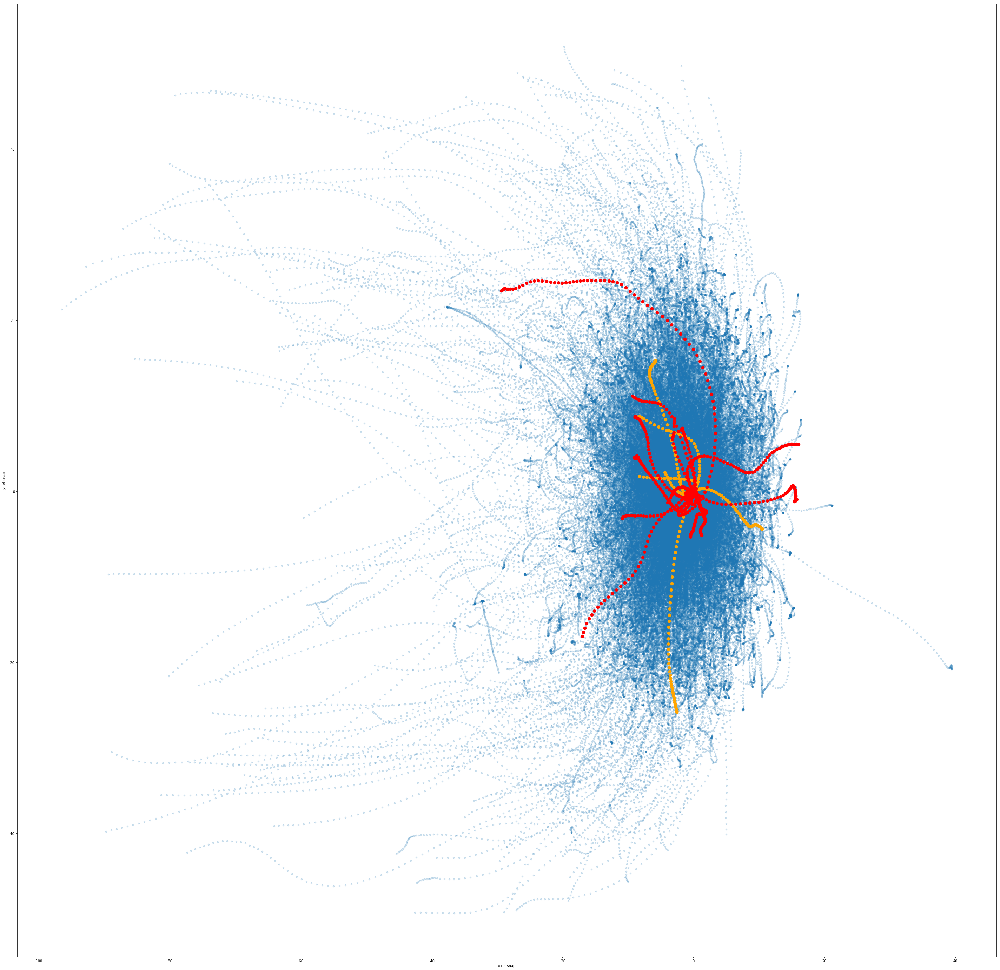

In [37]:
ax = punt_returned.plot(x='x-rel-snap',y='y-rel-snap', kind='scatter', figsize=(50, 50), alpha=0.2)

punt_returned[punt_returned['injured_player']].plot(x='x-rel-snap', y='y-rel-snap',
                                                        kind='scatter', figsize=(50, 50),
                                                       color='orange', lw=5, ax=ax)
punt_returned[punt_returned['primary_partner_player']].plot(x='x-rel-snap', y='y-rel-snap',
                                                        kind='scatter', figsize=(50, 50),
                                                       color='red', lw=5, ax=ax)
plt.show()

# PDL2 Position

In [47]:
play.dtypes

season_year                           int64
gamekey                               int64
playid                                int64
gsisid                                int64
time                                 object
x                                   float64
y                                   float64
dis                                 float64
o                                   float64
dir                                 float64
event                                object
number                               object
position                             object
role                                 object
generalized_role                     object
punting_returning_team               object
gsisid_injured                      float64
player_activity_derived             float64
turnover_related                    float64
primary_impact_type                 float64
primary_partner_gsisid              float64
primary_partner_activity_derived    float64
friendly_fire                   

In [38]:
role_df_all = pd.DataFrame()
role = 'PDL2'
count = 1
for filepath in tqdm(glob.iglob('../working/playlevel/during_play/*.csv')):
    play = pd.read_csv(filepath, index_col=[0])
    if len(play.loc[(play['role'] == role) & (play['event'].fillna('no event') == 'ball_snap')]) != 0:
        # Only append if this player and a snap exist for the play
        ballsnapx = play.loc[(play['role'] == role) & (play['event'] == 'ball_snap')]['x'].values[0]
        ballsnapy = play.loc[(play['role'] == role) & (play['event'] == 'ball_snap')]['y'].values[0]
        play['x-rel-snap'] = play['x'] - ballsnapx
        play['y-rel-snap'] = play['y'] - ballsnapy
        role_df = play.loc[(play['role'] == role)][['season_year','gamekey','playid','time',
                                          'x-rel-snap','y-rel-snap','mph','injured_player','primary_partner_player']]
        if not play['left_to_right'].values[0]:
            role_df['x-rel-snap'] = role_df['x-rel-snap'] * -1
            play['y-rel-snap'] = play['y-rel-snap'] * -1
        role_df_all = pd.concat([role_df_all, role_df])
    count += 1

role_df_all.to_parquet('../working/playlevel/{}_relative_pos_from_snap.parquet')

1851it [01:19, 23.19it/s]/Users/robmulla/anaconda2/envs/kaggle/lib/python3.6/site-packages/IPython/core/interactiveshell.py:2785: DtypeWarning: Columns (12) have mixed types. Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)
6647it [06:22, 17.38it/s]


In [43]:
role_df_all.

season_year                 int64
gamekey                     int64
playid                      int64
time                       object
x-rel-snap                float64
y-rel-snap                float64
mph                       float64
injured_player               bool
primary_partner_player       bool
dtype: object

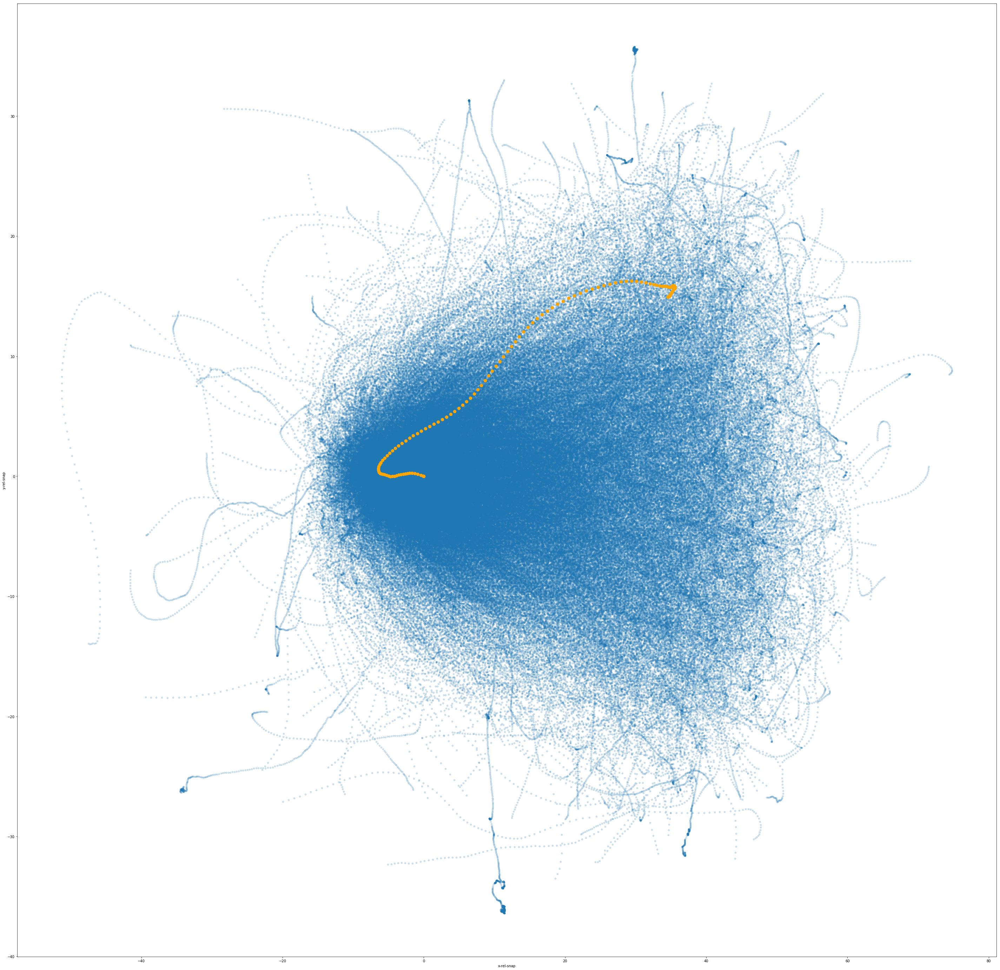

In [48]:
ax = role_df_all.plot(x='x-rel-snap',y='y-rel-snap', kind='scatter', figsize=(50, 50), alpha=0.2)

role_df_all[role_df_all['injured_player']].plot(x='x-rel-snap', y='y-rel-snap',
                                                         kind='scatter', figsize=(50, 50),
                                                        color='orange', lw=5, ax=ax)
# role_df_all[role_df_all['primary_partner_player']].plot(x='x-rel-snap', y='y-rel-snap',
#                                                         kind='scatter', figsize=(50, 50),
#                                                        color='red', lw=5, ax=ax)
plt.show()

# By 'Positions'

In [2]:
role_info_dict = {'GL': ['Gunner', 'Punting_Team'],
             'GLi': ['Gunner', 'Punting_Team'],
             'GLo': ['Gunner', 'Punting_Team'],
             'GR': ['Gunner', 'Punting_Team'],
             'GRi': ['Gunner', 'Punting_Team'],
             'GRo': ['Gunner', 'Punting_Team'],
             'P': ['Punter', 'Punting_Team'],
             'PC': ['Punter_Protector', 'Punting_Team'],
             'PPR': ['Punter_Protector', 'Punting_Team'],
             'PPRi': ['Punter_Protector', 'Punting_Team'],
             'PPRo': ['Punter_Protector', 'Punting_Team'],
             'PDL1': ['Defensive_Lineman', 'Returning_Team'],
             'PDL2': ['Defensive_Lineman', 'Returning_Team'],
             'PDL3': ['Defensive_Lineman', 'Returning_Team'],
             'PDR1': ['Defensive_Lineman', 'Returning_Team'],
             'PDR2': ['Defensive_Lineman', 'Returning_Team'],
             'PDR3': ['Defensive_Lineman', 'Returning_Team'],
             'PDL5': ['Defensive_Lineman', 'Returning_Team'],
             'PDL6': ['Defensive_Lineman', 'Returning_Team'],
             'PFB': ['PuntFullBack', 'Punting_Team'],
             'PLG': ['Punting_Lineman', 'Punting_Team'],
             'PLL': ['Defensive_Backer', 'Returning_Team'],
             'PLL1': ['Defensive_Backer', 'Returning_Team'],
             'PLL3': ['Defensive_Backer', 'Returning_Team'],
             'PLS': ['Punting_Longsnapper', 'Punting_Team'],
             'PLT': ['Punting_Lineman', 'Punting_Team'],
             'PLW': ['Punting_Wing', 'Punting_Team'],
             'PRW': ['Punting_Wing', 'Punting_Team'],
             'PR': ['Punt_Returner', 'Returning_Team'],
             'PRG': ['Punting_Lineman', 'Punting_Team'],
             'PRT': ['Punting_Lineman', 'Punting_Team'],
             'VLo': ['Jammer', 'Returning_Team'],
             'VR': ['Jammer', 'Returning_Team'],
             'VL': ['Jammer', 'Returning_Team'],
             'VRo': ['Jammer', 'Returning_Team'],
             'VRi': ['Jammer', 'Returning_Team'],
             'VLi': ['Jammer', 'Returning_Team'],
             'PPL': ['Punter_Protector', 'Punting_Team'],
             'PPLo': ['Punter_Protector', 'Punting_Team'],
             'PPLi': ['Punter_Protector', 'Punting_Team'],
             'PLR': ['Defensive_Backer', 'Returning_Team'],
             'PRRo': ['Defensive_Backer', 'Returning_Team'],
             'PDL4': ['Defensive_Lineman', 'Returning_Team'],
             'PDR4': ['Defensive_Lineman', 'Returning_Team'],
             'PLM': ['Defensive_Backer', 'Returning_Team'],
             'PLM1': ['Defensive_Backer', 'Returning_Team'],
             'PLR1': ['Defensive_Backer', 'Returning_Team'],
             'PLR2': ['Defensive_Backer', 'Returning_Team'],
             'PLR3': ['Defensive_Backer', 'Returning_Team'],
             'PLL2': ['Defensive_Backer', 'Returning_Team'],
             'PDM': ['Defensive_Lineman', 'Returning_Team'],
             'PDR5': ['Defensive_Lineman', 'Returning_Team'],
             'PDR6': ['Defensive_Lineman', 'Returning_Team'],
             }
role_info = pd.DataFrame.from_dict(role_info_dict, orient='index',
                                   columns=['generalized_role','punting_returning_team']).reset_index().rename(columns={'index' : 'role'})
role_info.to_csv('../working/role_info.csv')

## Loop through play info during action and join by player role

In [ ]:
for i, d in role_info.groupby('generalized_role'):
    try:
        print('Generalized Role {}'.format(i))
        if i == 'Defensive_Backer':
            print('aready ran, skipping')
            continue
        role_df_all = pd.DataFrame()
        roles = d['role'].unique()
        print('Roles {}'.format(roles))
        count = 1
        for filepath in tqdm(glob.iglob('../working/playlevel/during_play/*.csv')):
            play = pd.read_csv(filepath, index_col=[0])
            if len(play.loc[(play['role'].isin(roles)) & (play['event'].fillna('no event') == 'ball_snap')]) != 0:
                # Only append if this player and a snap exist for the play
                ballsnapx = play.loc[(play['role'].isin(roles)) & (play['event'] == 'ball_snap')]['x'].values[0]
                ballsnapy = play.loc[(play['role'].isin(roles)) & (play['event'] == 'ball_snap')]['y'].values[0]
                play['x-rel-snap'] = play['x'] - ballsnapx
                play['y-rel-snap'] = play['y'] - ballsnapy
                role_df = play.loc[(play['role'].isin(roles))][['season_year','gamekey','playid','time',
                                                                'x-rel-snap','y-rel-snap','mph','x','y','o','dis','dir',
                                                                'injured_player','primary_partner_player']]
                if not play['left_to_right'].values[0]:
                    role_df['x-rel-snap'] = role_df['x-rel-snap'] * -1
                    play['y-rel-snap'] = play['y-rel-snap'] * -1
                role_df_all = pd.concat([role_df_all, role_df])
            count += 1
        print('Saving Generalized Role to Parquet')
        role_df_all.to_parquet('../working/general_role/{}.parquet'.format(i))
    except:
        print('broke for {}'.format(i))

4it [00:00, 38.70it/s]

Generalized Role Defensive_Backer
aready ran, skipping
Generalized Role Defensive_Lineman
Roles ['PDL1' 'PDL2' 'PDL3' 'PDR1' 'PDR2' 'PDR3' 'PDL5' 'PDL6' 'PDL4' 'PDR4'
 'PDM' 'PDR5' 'PDR6']


915it [00:52, 17.47it/s]